In [1]:
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely.geometry
import seaborn as sns
import plotly.express as px
import re
from matplotlib.colors import TwoSlopeNorm
import missingno as msno
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib as mpl
import math
from scipy import stats
import statsmodels.formula.api as smf
import statsmodels.api as sm
import itertools
from collections.abc import Iterable
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_process import ArmaProcess
import pmdarima as pm
import warnings
from statsmodels.tools.sm_exceptions import ModelWarning
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.graphics import tsaplots
import datetime
from tqdm import tqdm

from linear_reg_diagnostics import Linear_Reg_Diagnostics # custom module

In [2]:
import plotly.io as pio
pio.renderers.default = 'notebook_connected'
pd.set_option('display.max_columns', None)

In [3]:
plt.style.use('default')
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['figure.dpi'] = 200

In [4]:
# Projected Coordinate System: how you project onto a 2D plane
epsg_2d = 26717 
# Toronto Police Service Open Data includes geographic location information provided in
# the projected coordinate system NAD 1927 UTM 17N
# https://epsg.io/26717

# Geographic Coordinate System: how coordinates are represented in a 3D space
# World Geodetic System 1984 (WGS84)
# https://epsg.io/4326
epsg_3d = 4326 

# Import data

## Neighbourhood population

In [5]:
neighbourhoods = gpd.read_file('../data/processed/neighbourhoods.geojson', driver='GeoJSON')
neighbourhoods_population = neighbourhoods[['hood_id', 'district', 'occurrence_year', 'population']].copy()
neighbourhoods_population['hood_id'] = neighbourhoods_population['hood_id'].astype(str)
neighbourhoods_population

,hood_id,district,occurrence_year,population
0,1,W10,2014,34745
1,1,W10,2015,34557
2,1,W10,2016,34418
3,1,W10,2017,35085
4,1,W10,2018,35772
...,...,...,...,...
1255,99,C10,2018,17633
1256,99,C10,2019,17812
1257,99,C10,2020,17972
1258,99,C10,2021,18261


## Distance from University of Toronto

In [6]:
distance_df = neighbourhoods[['hood_id', 'distance_km']].drop_duplicates()
distance_df['hood_id'] = distance_df['hood_id'].astype(str)
distance_df

,hood_id,distance_km
0,1,17.220696
9,10,12.002139
18,100,4.698649
27,101,3.830372
36,102,5.291102
...,...,...
1215,95,1.181546
1224,96,2.336954
1233,97,2.791765
1242,98,2.578980


## Number of crimes per 100k population

In [7]:
mci_df = pd.read_csv('../data/processed/neighbourhoods_crime.csv')
mci_df = mci_df[(mci_df['MCI'] == 'MCI') & (mci_df['type'] == 'rate')]
mci_df.rename(columns={'value': 'MCI_rate'}, inplace=True)
mci_df['occurrence_date'] = pd.PeriodIndex(year=mci_df['occurrence_year'], quarter=mci_df['occurrence_quarter']).end_time.date
mci_df = mci_df[['occurrence_date', 'occurrence_year', 'occurrence_quarter', 'hood_id', 'MCI_rate']]
mci_df['hood_id'] = mci_df['hood_id'].astype(str)
mci_df

,occurrence_date,occurrence_year,occurrence_quarter,hood_id,MCI_rate
35868,2014-03-31,2014,1,1,509.425817
35869,2014-06-30,2014,2,1,659.087639
35870,2014-09-30,2014,3,1,523.816376
35871,2014-12-31,2014,4,1,595.769175
35900,2015-03-31,2015,1,1,422.490378
...,...,...,...,...,...
71647,2020-12-31,2020,4,99,122.412642
71676,2021-03-31,2021,1,99,109.523027
71677,2021-06-30,2021,2,99,175.236844
71678,2021-09-30,2021,3,99,147.856087


## Traffic collisions per 100k population

In [8]:
collision_df = pd.read_csv('../data/processed/neighbourhoods_collision.csv')
collision_df = collision_df[(collision_df['collision_type'] == 'collision') & (collision_df['type'] == 'rate')]
collision_df.rename(columns={'value': 'collision_rate'}, inplace=True)
collision_df['occurrence_date'] = pd.PeriodIndex(year=collision_df['occurrence_year'], quarter=collision_df['occurrence_quarter']).end_time.date
collision_df = collision_df[['occurrence_date', 'occurrence_year', 'occurrence_quarter', 'hood_id', 'collision_rate']]
collision_df['hood_id'] = collision_df['hood_id'].astype(str)
collision_df

,occurrence_date,occurrence_year,occurrence_quarter,hood_id,collision_rate
22400,2014-03-31,2014,1,1,1015.973521
22401,2014-06-30,2014,2,1,872.067923
22402,2014-09-30,2014,3,1,926.752051
22403,2014-12-31,2014,4,1,897.970931
22420,2015-03-31,2015,1,1,972.306624
...,...,...,...,...,...
44763,2020-12-31,2020,4,99,411.751614
44780,2021-03-31,2021,1,99,301.188325
44781,2021-06-30,2021,2,99,246.426811
44782,2021-09-30,2021,3,99,388.806747


## Lease rate for shared apartment

In [208]:
roomtype = 'SharedApartments' # 2 or 3 bedroom apartments
neighbourhoods_rent = pd.read_csv('../data/processed/rent.csv')
neighbourhoods_rent.rename(columns={'Year': 'occurrence_year', 'Quarter': 'occurrence_quarter'}, inplace=True)
neighbourhoods_rent = neighbourhoods_rent[(neighbourhoods_rent['occurrence_year'] >= 2014) & 
                                          (neighbourhoods_rent['RoomType'] == roomtype)]
neighbourhoods_rent = neighbourhoods_population[['hood_id', 'district']].drop_duplicates().merge(neighbourhoods_rent, on = 'district')
neighbourhoods_rent['occurrence_date'] = pd.PeriodIndex(year=neighbourhoods_rent['occurrence_year'], quarter=neighbourhoods_rent['occurrence_quarter']).end_time.date
neighbourhoods_rent = neighbourhoods_rent[['occurrence_date', 'occurrence_year', 'occurrence_quarter', 'hood_id', 'LeasedvsListed_AllApartments', 'AvgLeaseRatePerRoom']]
neighbourhoods_rent['hood_id'] = neighbourhoods_rent['hood_id'].astype(str)
neighbourhoods_rent

,occurrence_date,occurrence_year,occurrence_quarter,hood_id,LeasedvsListed_AllApartments,AvgLeaseRatePerRoom
0,2014-03-31,2014,1,1,0.444444,661.647059
1,2014-06-30,2014,2,1,0.651163,703.361702
2,2014-09-30,2014,3,1,0.586957,715.241379
3,2014-12-31,2014,4,1,0.500000,667.428571
4,2015-03-31,2015,1,1,0.444444,691.555556
...,...,...,...,...,...,...
4755,2021-06-30,2021,2,98,0.484848,1751.264706
4756,2021-09-30,2021,3,98,0.594340,1664.652174
4757,2021-12-31,2021,4,98,0.653333,1883.956693
4758,2022-03-31,2022,1,98,0.523810,1753.894737


# Create regression_df

In [13]:
regression_table = neighbourhoods_rent.\
    merge(mci_df, on=['hood_id', 'occurrence_date', 'occurrence_year', 'occurrence_quarter'], how='inner').\
    merge(collision_df, on=['hood_id', 'occurrence_date', 'occurrence_year', 'occurrence_quarter'], how='inner').\
    merge(distance_df, on=['hood_id'], how='inner')
regression_table.ffill(inplace=True)

In [185]:
Y = 'AvgLeaseRatePerRoom'
Xs = ['LeasedvsListed_AllApartments', 'MCI_rate', 'collision_rate', 'distance_km']
regression_table[['hood_id', 'occurrence_date'] + [Y] + Xs]

,hood_id,occurrence_date,AvgLeaseRatePerRoom,LeasedvsListed_AllApartments,MCI_rate,collision_rate,distance_km
0,1,2014-03-31,661.647059,0.444444,509.425817,1015.973521,17.220696
1,1,2014-06-30,703.361702,0.651163,659.087639,872.067923,17.220696
2,1,2014-09-30,715.241379,0.586957,523.816376,926.752051,17.220696
3,1,2014-12-31,667.428571,0.500000,595.769175,897.970931,17.220696
4,1,2015-03-31,691.555556,0.444444,422.490378,972.306624,17.220696
...,...,...,...,...,...,...,...
4475,98,2020-12-31,1674.339623,0.289474,358.755751,261.680665,2.578980
4476,98,2021-03-31,1599.648649,0.380000,285.702455,161.483997,2.578980
4477,98,2021-06-30,1751.264706,0.484848,248.436918,194.608919,2.578980
4478,98,2021-09-30,1664.652174,0.594340,289.843071,364.374146,2.578980


In [186]:
regression_df = regression_table[[Y] + Xs].copy()
regression_df['Time'] = regression_table['occurrence_year'] + regression_table['occurrence_quarter'] / 4
regression_df['Quarter'] = regression_table['occurrence_quarter']
regression_df['hood_id'] = regression_table['hood_id']
# regression_df = pd.concat([regression_df, 
#                            pd.get_dummies(pd.Series(['Q' + str(x) for x in regression_table['occurrencedate'].dt.quarter]), drop_first = True),
#                            pd.get_dummies(pd.Series(['N' + str(x) for x in regression_table['hood_id']]), drop_first = True)],
#                           axis=1)
regression_df.rename(columns={'AvgLeaseRatePerRoom': 'Rent',
                              'LeasedvsListed_AllApartments': 'Lease_Demand',
                              'MCI_rate': 'Crime',
                              'collision_rate': 'Traffic_Collisions',
                              'distance_km': 'Distance'}, inplace=True)
regression_df

,Rent,Lease_Demand,Crime,Traffic_Collisions,Distance,Time,Quarter,hood_id
0,661.647059,0.444444,509.425817,1015.973521,17.220696,2014.25,1,1
1,703.361702,0.651163,659.087639,872.067923,17.220696,2014.50,2,1
2,715.241379,0.586957,523.816376,926.752051,17.220696,2014.75,3,1
3,667.428571,0.500000,595.769175,897.970931,17.220696,2015.00,4,1
4,691.555556,0.444444,422.490378,972.306624,17.220696,2015.25,1,1
...,...,...,...,...,...,...,...,...
4475,1674.339623,0.289474,358.755751,261.680665,2.578980,2021.00,4,98
4476,1599.648649,0.380000,285.702455,161.483997,2.578980,2021.25,1,98
4477,1751.264706,0.484848,248.436918,194.608919,2.578980,2021.50,2,98
4478,1664.652174,0.594340,289.843071,364.374146,2.578980,2021.75,3,98


In [187]:
# Dependent variable
Y = 'Rent'
# Independent numeric variables
Xs_numeric = ['Lease_Demand', 'Crime', 'Traffic_Collisions', 'Distance']
# All independent variables
Xs = Xs_numeric + ['Time', 'C(Quarter)', 'C(hood_id)']

# Correlation plot
- The first row of correlation matrix shows the correlation between our dependent variable (Rent) and other independent variables. 
- It makes sense that distance from the University of Toronto has a negative correlation with rent since you don't want to pay as much if you need to spend more time on commute.
- Given the strong correlation between crime and traffic collision, we might need to check if there is  multicollinearity
- The first row of pairplot shows the linear regression results between Y and Xs

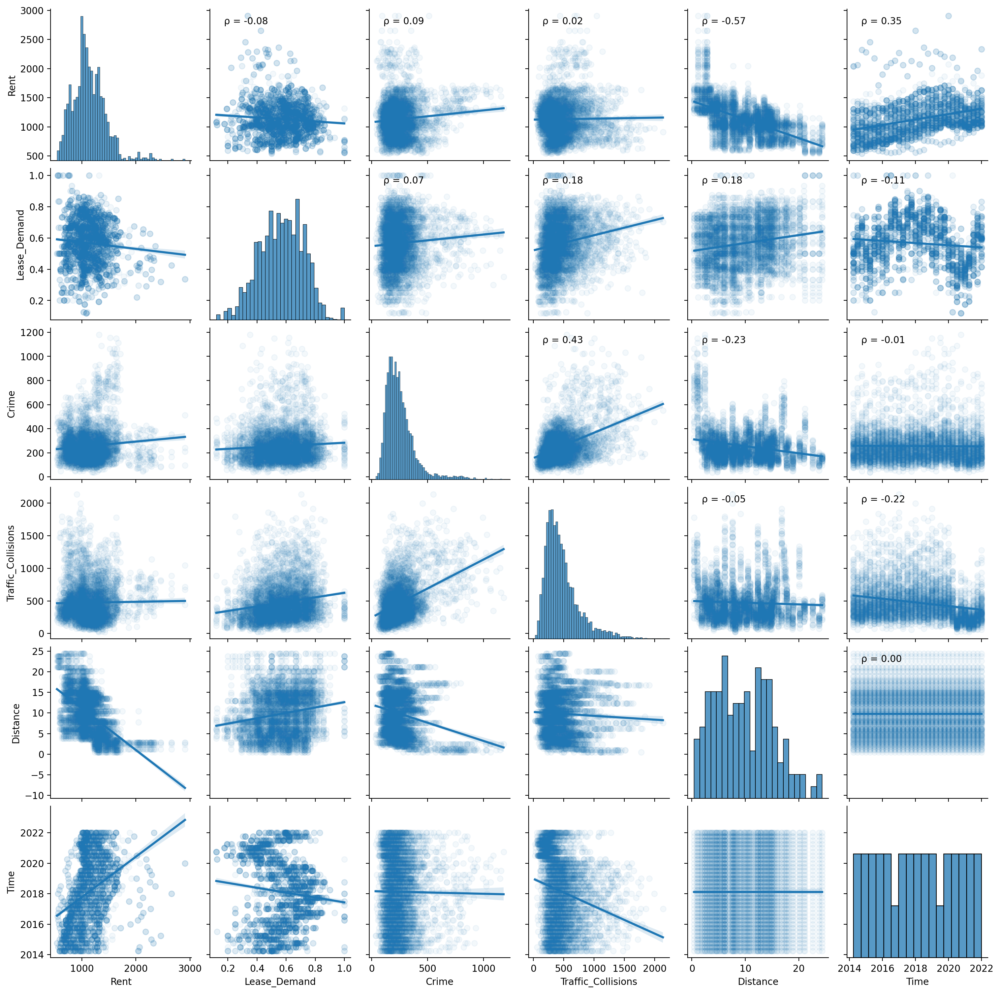

In [32]:
def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r = np.corrcoef(x, y)[0,1]
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    
g = sns.pairplot(regression_df[[Y] + Xs_numeric + ['Time']], 
             kind = 'reg', 
             diag_kind='hist', 
             plot_kws={'scatter_kws': {'alpha':0.05}})
g.map_upper(corrfunc)
g

# Transform features

## Log transform crime and traffic collisions

In [188]:
regression_df[['Crime', 'Traffic_Collisions']] = np.log(regression_df[['Crime', 'Traffic_Collisions']])
regression_df.head()

,Rent,Lease_Demand,Crime,Traffic_Collisions,Distance,Time,Quarter,hood_id
0,661.647059,0.444444,6.233284,6.923603,17.220696,2014.25,1,1
1,703.361702,0.651163,6.490857,6.770867,17.220696,2014.50,2,1
2,715.241379,0.586957,6.261141,6.831686,17.220696,2014.75,3,1
3,667.428571,0.500000,6.389853,6.800138,17.220696,2015.00,4,1
4,691.555556,0.444444,6.046167,6.879671,17.220696,2015.25,1,1


## Standardize quantitative independent variables
- Ease of interpretation by avoiding extremely small or large coefficients
- Each estimated coefficient = impact on Y given + 1 sd movement in X given other independent variables are kept constant
- Distribution of independent variables will remain the same

In [189]:
regression_df[Xs_numeric] = stats.zscore(regression_df[Xs_numeric])
regression_df.head()

,Rent,Lease_Demand,Crime,Traffic_Collisions,Distance,Time,Quarter,hood_id
0,661.647059,-0.798436,1.690201,1.578573,1.361572,2014.25,1,1
1,703.361702,0.557333,2.228434,1.320586,1.361572,2014.50,2,1
2,715.241379,0.136234,1.748412,1.423316,1.361572,2014.75,3,1
3,667.428571,-0.434073,2.017374,1.370027,1.361572,2015.00,4,1
4,691.555556,-0.798436,1.299193,1.504368,1.361572,2015.25,1,1


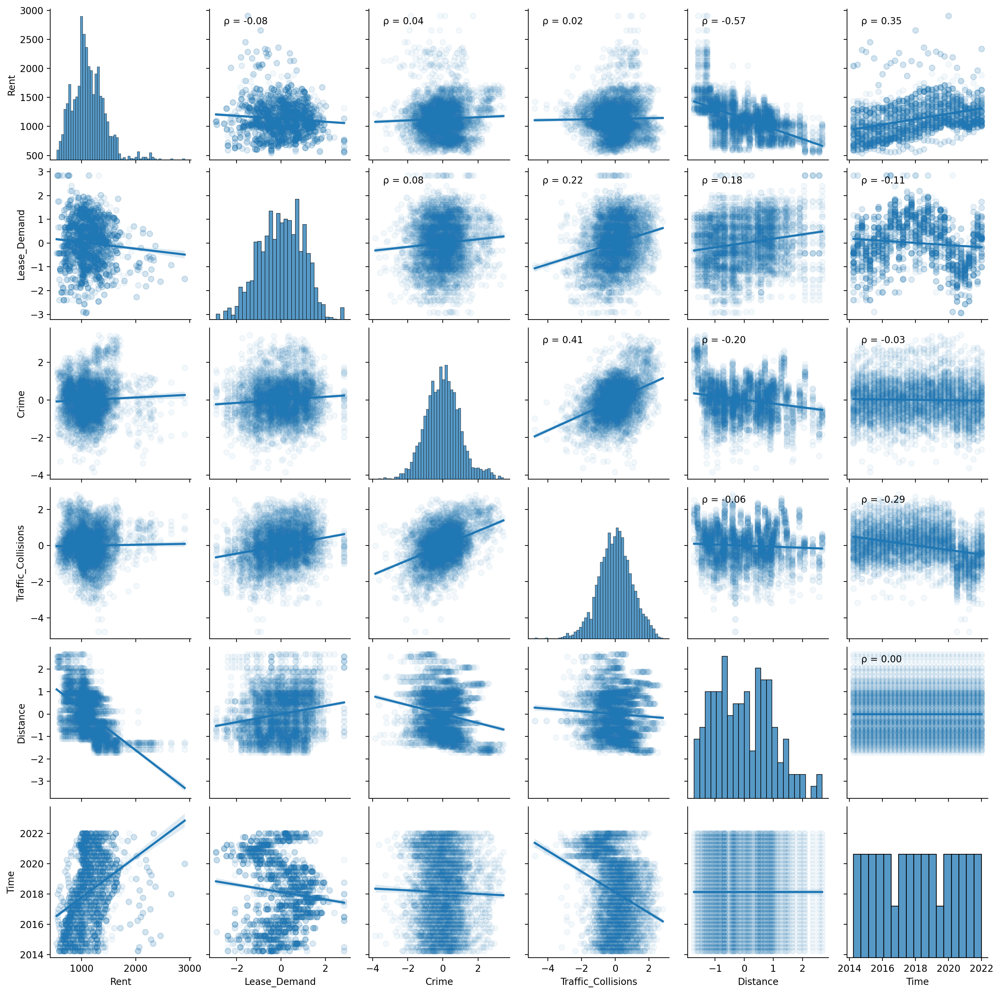

In [37]:
def corrfunc(x, y, ax=None, **kws):
    """Plot the correlation coefficient in the top left hand corner of a plot."""
    r = np.corrcoef(x, y)[0,1]
    ax = ax or plt.gca()
    ax.annotate(f'ρ = {r:.2f}', xy=(.1, .9), xycoords=ax.transAxes)
    
g = sns.pairplot(regression_df[[Y] + Xs_numeric + ['Time']], 
             kind = 'reg', 
             diag_kind='hist', 
             plot_kws={'scatter_kws': {'alpha':0.05}})
g.map_upper(corrfunc)
g

# Panel data regression result
- Our data is a panel data grouped by time and hood_ID
- Instead of doing a pooled OLS, let's take into account of the time and neighbourhood_ID to build a panel data regression model
  - fixed effects instead of random effects
    - fixed effects eliminate omitted variable bias -> improve interpretability of coefficients
    - fixed effects do not assume any particular distribution
- https://faculty.washington.edu/cadolph/?page=24 

## Best subsets regression
- Variable selection procedure for a specified number of independent variables based on adjusted R squared
- Given there is no significant benefit from including variables other than distance, let's use that as our model

In [38]:
def flatten(l):
    for el in l:
        if isinstance(el, Iterable) and not isinstance(el, (str, bytes)):
            yield from flatten(el)
        else:
            yield el

In [39]:
# https://www.statsmodels.org/devel/example_formulas.html
best_models = []
for i in range(len(Xs)):
    n = i + 1
    best_rsq = 0
    best_combo = []
    for combo in itertools.combinations(Xs, n):
        rsq_adj = smf.ols(formula = Y + ' ~ ' + ' + '.join(combo), data = regression_df).fit().rsquared_adj
        if rsq_adj > best_rsq:
            best_combo = combo
            best_rsq = rsq_adj
    best_models.append(best_combo)
    print(f"Highest adjusted R squared achieved with {n} variable(s) = {best_rsq:0.3f} = {Y} ~ {' + '.join(best_combo)}")

Highest adjusted R squared achieved with 1 variable(s) = 0.739 = Rent ~ C(hood_id)
Highest adjusted R squared achieved with 2 variable(s) = 0.868 = Rent ~ Time + C(hood_id)
Highest adjusted R squared achieved with 3 variable(s) = 0.883 = Rent ~ Traffic_Collisions + Time + C(hood_id)
Highest adjusted R squared achieved with 4 variable(s) = 0.884 = Rent ~ Traffic_Collisions + Time + C(Quarter) + C(hood_id)
Highest adjusted R squared achieved with 5 variable(s) = 0.884 = Rent ~ Lease_Demand + Traffic_Collisions + Time + C(Quarter) + C(hood_id)
Highest adjusted R squared achieved with 6 variable(s) = 0.884 = Rent ~ Lease_Demand + Traffic_Collisions + Distance + Time + C(Quarter) + C(hood_id)
Highest adjusted R squared achieved with 7 variable(s) = 0.884 = Rent ~ Lease_Demand + Crime + Traffic_Collisions + Distance + Time + C(Quarter) + C(hood_id)


In [40]:
# Let's pick the best model with 3 variables as R squared does not seem to improve after adding extra variables
Xs_best_subset = ['Traffic_Collisions', 'Time', 'C(hood_id)']
best_subset = smf.ols(formula = Y + ' ~ ' + ' + '.join(Xs_best_subset), data = regression_df).fit()

In [41]:
# Significant F value
print(f"F value: {best_subset.fvalue:0.3f}, p-value: {best_subset.f_pvalue:0.3f}")

F value: 240.008, p-value: 0.000


### First take
- While F test is significant, we need to rule out the impact from outliers, influential observations and multicollinearity
- VIF of Traffic_Collisions suggest some degree of multicollinearity
  - Indeed the positive sign of traffic_collisions to rent is hardly justified
    - Does it mean people prefer apartments in neighbourhood with higher rate of traffic accidents?
    - Does it mean people prefer living in areas with heavy traffic such that there are more traffic collisions per 100k population?
- No outliers and influential observations

In [43]:
best_subset.params

Intercept            -112302.125634
C(hood_id)[T.10]         382.479865
C(hood_id)[T.100]        491.257174
C(hood_id)[T.101]        534.532683
C(hood_id)[T.102]        465.772683
                          ...      
C(hood_id)[T.97]        1322.428575
C(hood_id)[T.98]         829.785530
C(hood_id)[T.99]         540.410364
Traffic_Collisions        72.650469
Time                      56.033480
Length: 142, dtype: float64

In [42]:
# Check multicollinearity
cls = Linear_Reg_Diagnostics(best_subset)
cls.vif_table()

               Features  VIF Factor
139  Traffic_Collisions        3.82
16    C(hood_id)[T.114]        2.43
7     C(hood_id)[T.106]        2.25
96     C(hood_id)[T.60]        2.24
128     C(hood_id)[T.9]        2.22
..                  ...         ...
59     C(hood_id)[T.27]        1.99
113    C(hood_id)[T.76]        1.99
116    C(hood_id)[T.79]        1.99
129    C(hood_id)[T.90]        1.99
140                Time        1.33

[141 rows x 2 columns]


### Model refinement
- Let's pick the best model with 2 variables instead
  1) VIF of Traffic_Collisions suggest some degree of multicollinearity
  2) While adding Traffic_Collisions can improve the model, it does not seem to be significant based on the correlation plot
  3) Keeping time and hood_id as indepednet variables can also make prediction easier as both are fixed variables

In [44]:
# Let's pick the best model with 2 variables
# 1) while adding Traffic_Collisions can improve the model, it does not seem to be significant based on the correlation plot
# 2) keeping time and hood_id as indepednet variables can also make prediction easier as both are fixed variables
Xs_best_subset = ['Time', 'C(hood_id)']
best_subset = smf.ols(formula = Y + ' ~ ' + ' + '.join(Xs_best_subset), data = regression_df).fit()

In [45]:
best_subset.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Rent   R-squared:                       0.872
Model:                            OLS   Adj. R-squared:                  0.868
Method:                 Least Squares   F-statistic:                     210.5
Date:                Mon, 01 Aug 2022   Prob (F-statistic):               0.00
Time:                        14:32:44   Log-Likelihood:                -27404.
No. Observations:                4480   AIC:                         5.509e+04
Df Residuals:                    4339   BIC:                         5.599e+04
Df Model:                         140                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept         -9.349e+04   1456.723    -64.179      0.000   -9.63e+04   -9.06e+04
C(hood_id)[T.10]    208.6395     27.878      7.484      0.000     153.985     263.294
C(hood_id)[T.100]   439.2182     27.878     15.755      0.000     384.564     493.872
C(hood_id)[T.101]   439.2182     27.878     15.755      0.000     384.564     493.872
C(hood_id)[T.102]   401.7984     27.878     14.413      0.000     347.144     456.453
C(hood_id)[T.103]   401.7984     27.878     14.413      0.000     347.144     456.453
C(hood_id)[T.104]   482.2866     27.878     17.300      0.000     427.632     536.941
C(hood_id)[T.105]   401.7984     27.878     14.413      0.000     347.144     456.453
C(hood_id)[T.106]   439.2182     27.878     15.755      0.000     384.564     493.872
C(hood_id)[T.107]   439.2182     27.878     15.755      0.000     384.564     493.872
C(hood_id)[T.108]    64.1852     27.878      2.302      0.021       9.531     118.840
C(hood_id)[T.109]    37.8383     27.878      1.357      0.175     -16.816      92.493
C(hood_id)[T.11]    208.6395     27.878      7.484      0.000     153.985     263.294
C(hood_id)[T.110]    37.8383     27.878      1.357      0.175     -16.816      92.493
C(hood_id)[T.111]    37.8383     27.878      1.357      0.175     -16.816      92.493
C(hood_id)[T.112]    64.1852     27.878      2.302      0.021       9.531     118.840
C(hood_id)[T.113]    64.1852     27.878      2.302      0.021       9.531     118.840
C(hood_id)[T.114]   381.3303     27.878     13.679      0.000     326.676     435.985
C(hood_id)[T.115]    64.1852     27.878      2.302      0.021       9.531     118.840
C(hood_id)[T.116]    46.1048     27.878      1.654      0.098      -8.550     100.759
C(hood_id)[T.117]    46.1048     27.878      1.654      0.098      -8.550     100.759
C(hood_id)[T.118]    46.1048     27.878      1.654      0.098      -8.550     100.759
C(hood_id)[T.119]   -13.8855     27.878     -0.498      0.618     -68.540      40.769
C(hood_id)[T.12]    208.6395     27.878      7.484      0.000     153.985     263.294
C(hood_id)[T.120]   -13.8855     27.878     -0.498      0.618     -68.540      40.769
C(hood_id)[T.121]   246.3954     27.878      8.838      0.000     191.741     301.050
C(hood_id)[T.122]   246.3954     27.878      8.838      0.000     191.741     301.050
C(hood_id)[T.123]   -44.3831     27.878     -1.592      0.111     -99.037      10.271
C(hood_id)[T.124]   -13.8855     27.878     -0.498      0.618     -68.540      40.769
C(hood_id)[T.125]   -13.8855     27.878     -0.498      0.618     -68.540      40.769
C(hood_id)[T.126]   -13.8855     27.878     -0.498      0.618     -68.540      40.769
C(hood_id)[T.127]   115.6219     27.878      4.147      0.000      60.968     170.276
C(hood_id)[T.128]    25.3932     27.878      0.911      0.362     -29.261

### Intuitive interpretation
- If we plot the Rent vs Time, you can see there is a general upward slope due to inflation
- If we group each neighbourhood, you can see while the slope is generally similar, they have 
  - different intercepts, and
  - similar slopes
- More expensive regions will tend to be more expensive

Text(0.5, 1.0, 'Each neighbourhood (coloured line) is different')

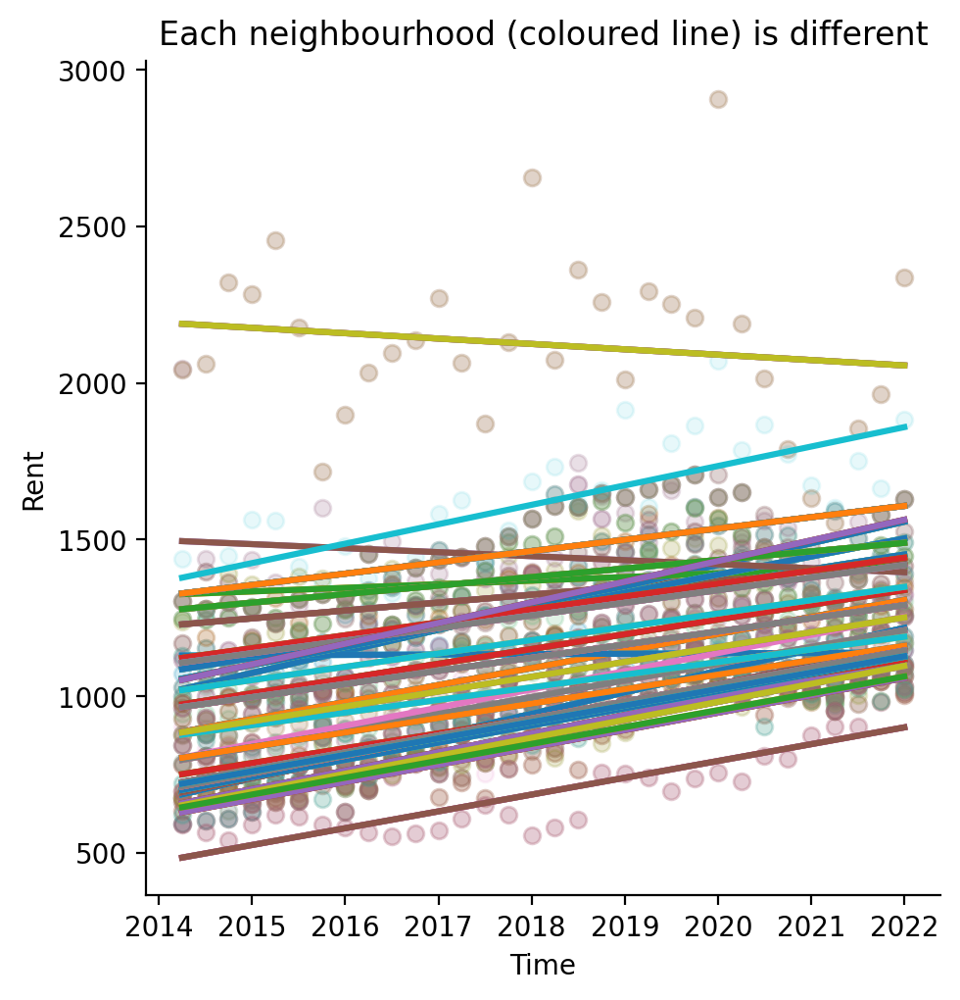

In [52]:
sns.lmplot(x='Time', y='Rent', data=regression_df, hue='hood_id', palette='tab10', legend=False, ci=None, scatter_kws={'alpha':0.10}, height=5)
plt.title('Each neighbourhood (coloured line) is different')

In [53]:
# hood_id 94-97 is the most expensive neighbourhood, about $1000 more expensive per room on average
best_subset.params.sort_values(ascending=False)

C(hood_id)[T.95]      1234.470890
C(hood_id)[T.94]      1234.470890
C(hood_id)[T.96]      1234.470890
C(hood_id)[T.97]      1234.470890
C(hood_id)[T.98]       730.654103
                         ...     
C(hood_id)[T.139]      -44.383124
C(hood_id)[T.134]     -195.493247
C(hood_id)[T.136]     -195.493247
C(hood_id)[T.133]     -195.493247
Intercept           -93491.379108
Length: 141, dtype: float64

### Residual diagnostics

- Mulptiple signs show that the assumptions about regression residuals are violated 
  - Upper left: expected value of residuals is close to 0 but not constant across fitted values (y_hat)
  - Lower left: signs of heteroscedasticity and autocorrelation among residuals suggested by Ljung-Box test
  - Upper right: residuals do not follow normal distribution suggested by Jarque-Bera test and q-q plot
  - Lower right: there are no outliers or influential observations with Cook's distance > 1


Although the above departures from the assumptions might not be extreme enough to make the standard error of estimated parameters completely unreliable, 
  > let's not interpret the statistical tests first and verify the results with bootstrapping instead

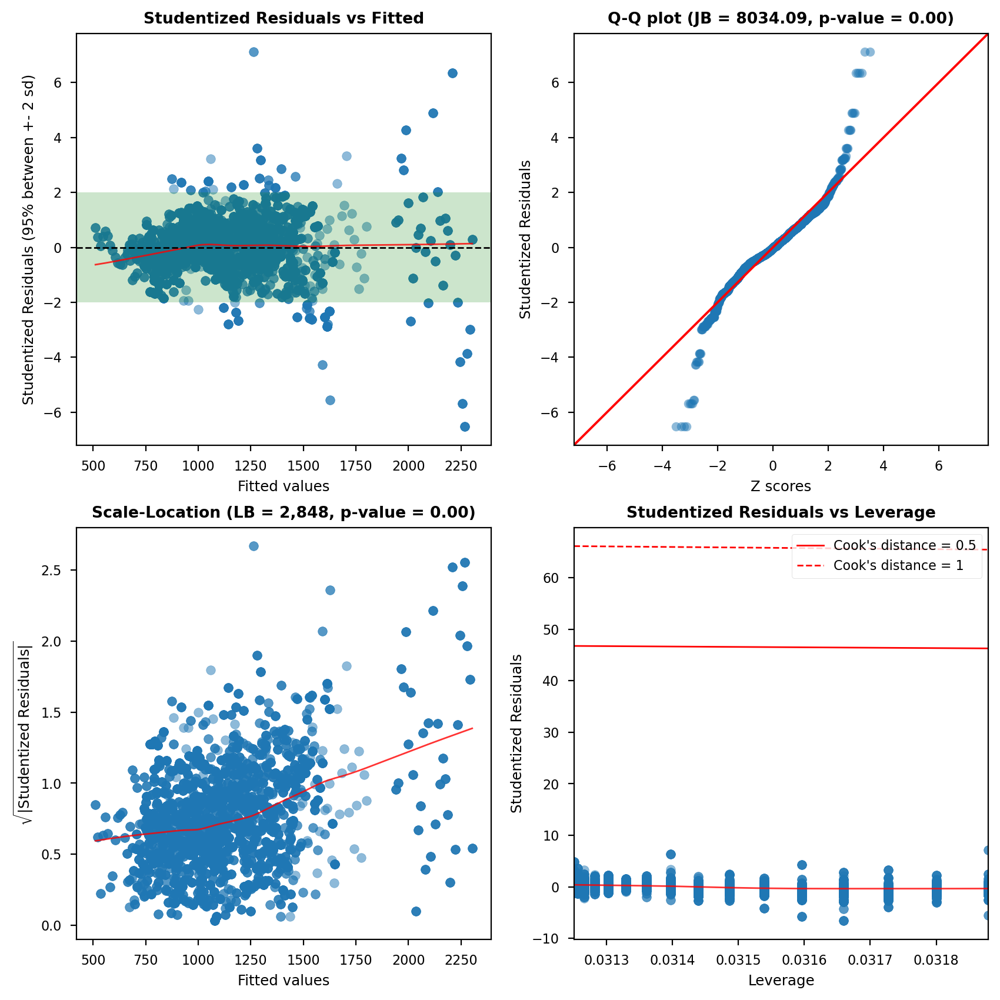

              Features  VIF Factor
104   C(hood_id)[T.68]        1.99
50    C(hood_id)[T.19]        1.99
91    C(hood_id)[T.56]        1.99
0     C(hood_id)[T.10]        1.99
84     C(hood_id)[T.5]        1.99
..                 ...         ...
95     C(hood_id)[T.6]        1.99
62     C(hood_id)[T.3]        1.99
105   C(hood_id)[T.69]        1.99
27   C(hood_id)[T.124]        1.99
139               Time        1.00

[140 rows x 2 columns]


In [54]:
# Let's check the residuals and multicollinearity again
cls = Linear_Reg_Diagnostics(best_subset)
fig, ax = cls()

### Bootstrapping F test
- While the F statistic suggests significance in our model, the assumptions of residuals are clearly violated 
- Thus we cannot trust that our F statistic will follow the asymptotic F distribution and trust the p-value for now
- Instead let's apply bootstrapping to see if our F statistic is really significant
- Bootstrapping Regression Models https://artowen.su.domains/courses/305-1314/FoxOnBootingRegInR.pdf
- https://stats.stackexchange.com/questions/59670/multiple-regression-and-multiple-comparisons
- https://stats.stackexchange.com/questions/167289/is-there-a-multiple-testing-problem-when-performing-t-tests-for-multiple-coeffci
- https://online.stat.psu.edu/stat462/node/135/

In [55]:
print(f"F value: {best_subset.fvalue}, p-value: {best_subset.f_pvalue:0.3f}")

F value: 210.4892524456323, p-value: 0.000


In [27]:
# compute F statistic to indicate the significance of extra variables by comparing the restricted vs full regression model
# def compute_F(formula_full, formula_restricted = None, data = regression_df, intercept_only = False):
#     full_model = smf.ols(formula = formula_full, data = data).fit()
    
#     if intercept_only:
#         # only consider the intercept
#         restricted_model = sm.OLS(regression_df[Y], np.ones(len(regression_df[Y]))).fit()
#     else:
#         restricted_model = smf.ols(formula = formula_restricted, data = data).fit()
#     F_value = (restricted_model.ssr - full_model.ssr) / (restricted_model.df_resid - full_model.df_resid) / (full_model.ssr / full_model.df_resid)
#     return F_value

# compute_F(formula_full= Y + ' ~ ' + ' + '.join(Xs_best_subset),
#           intercept_only=True)

In [56]:
# function to compute F value given the Y and Xs
def compute_F(df, null_true = False):
    X_df = pd.concat([pd.get_dummies(df['hood_id'], drop_first = True), df['Time']], axis=1)
    X_df.insert(0, 'Intercept', 1)
    X_df = X_df.values
    # speed up regression with matrix inverse method
    coef = np.linalg.inv(X_df.T @ X_df) @ X_df.T @ df[Y].values
    if null_true:
        # if null hypothesis of F test is true, all coefficients are zero except the intercept
        # Y would be a series of intercept + residuals
        resid = df[Y].values - X_df @ coef
        intercept = coef[0]
        Y_df = np.random.choice(intercept + resid, size = len(df[Y]), replace = True)
    else:
        Y_df = df[Y].values
    boot_coef = np.linalg.inv(X_df.T @ X_df) @ X_df.T @ Y_df
    # MSR = sum of squares due to regression / p
    msr = np.sum((X_df @ boot_coef - np.mean(Y_df))**2) / (len(boot_coef) - 1)
    # MSE = sum of squares due to error / (n - p - 1)
    mse = np.sum((Y_df - X_df @ boot_coef)**2) / (len(Y_df) - len(boot_coef))
    f_value = msr / mse
    return f_value

# test
compute_F(regression_df)

210.48925244298533

In [57]:
np.random.seed(123)
# calculating many bootstrap replicates
def draw_bs_reps(df, size=10**4):
    """Draw bootstrap F value of linear regression."""

    # Initialize array of replicates: bs_replicates
    bs_replicate_fvalue = np.empty(size)
    
    # Generate replicates
    with tqdm(total=size) as pbar:
        for i in range(size):
            inds = np.arange(df.shape[0])
            # generate a list of indices with replacement with the same size as our original dataframe
            # to ensure the distribution of bootstrap replicates is the same as that of our estimated coefficients
            bs_inds = np.random.choice(inds, size = len(inds), replace = True)
            # pairwise bootstrapping on Y and Xs assuming random-x resampling
            # as fixed-x resampling assumes residuals are iid (which is not true as we see the mean and variance is not contsant from residual diagnostics)
            bootstrap_df = df.iloc[bs_inds]
            bs_replicate_fvalue[i] = compute_F(bootstrap_df, null_true=True)
            
            pbar.update(1)

    return bs_replicate_fvalue

In [58]:
# we may consider swithcing to fixed-x resampling if we want to cut the running time 
# as we will only need to run linear regression once instead of twice
bs_fvalue = draw_bs_reps(regression_df)

100%|██████████| 10000/10000 [06:02<00:00, 27.56it/s]


#### Bootstrapping diagnostics
Can we trust the bootstrapping results?
  - Our original sample size is big enough with 4,000+ unique rows to be representative of the underlying population
  - Number of bootstrapped samples at 10,000 is large enough 
  - Distribution of bootstrap F values look like F distribution

All the above signs can give us confidence to use the bootstrap replicates to gauge the statisitcal significance of our F statistic

> Given our bootstrapped F distribution, our observed F statistic is significant at 95% confidence

Text(1.20741004113548, 500, '95th percentile cutoff = 1.2074')

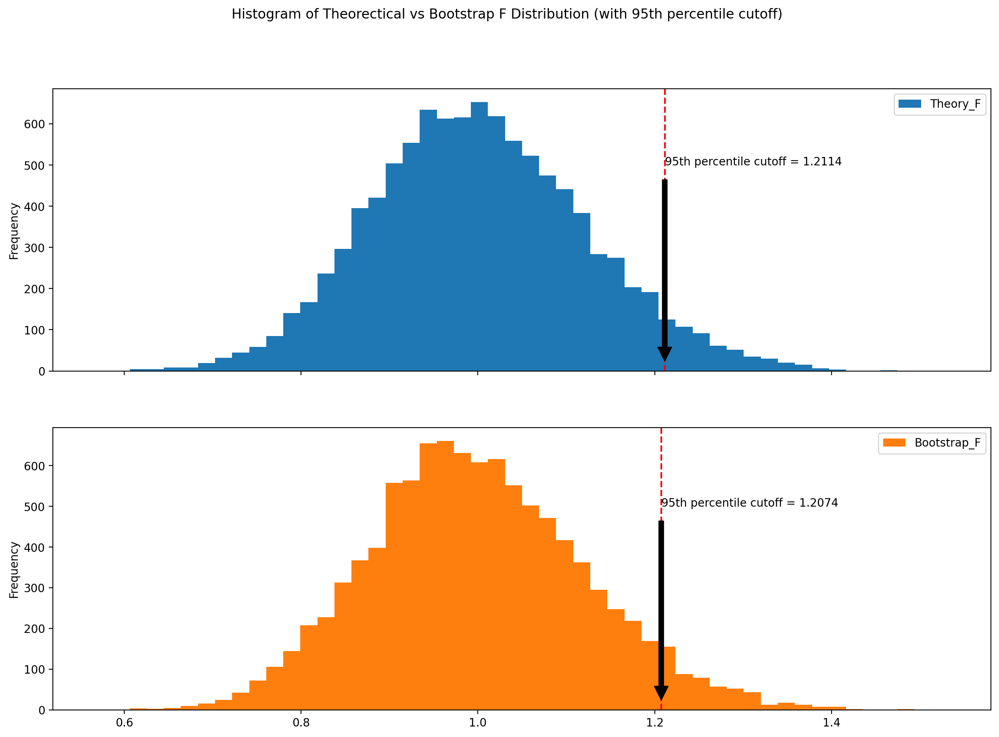

In [59]:
boot_df = pd.DataFrame({'Theory_F': np.random.f(best_subset.df_model, best_subset.df_resid, len(bs_fvalue)),
                        'Bootstrap_F': bs_fvalue})
ax = boot_df.plot(kind = 'hist', subplots = True, bins = 50, title = 'Histogram of Theorectical vs Bootstrap F Distribution (with 95th percentile cutoff)')
ax[0].axvline(boot_df.Theory_F.quantile(0.95), color = 'red', linestyle = '--')
ax[0].annotate(f'95th percentile cutoff = {boot_df.Theory_F.quantile(0.95):0.4f}',
               xy = (boot_df.Theory_F.quantile(0.95), 0), 
               xytext = (boot_df.Theory_F.quantile(0.95), 500), 
               arrowprops = dict(facecolor = 'black', shrink = 0.05))
ax[1].axvline(boot_df.Bootstrap_F.quantile(0.95), color = 'red', linestyle = '--')
ax[1].annotate(f'95th percentile cutoff = {boot_df.Bootstrap_F.quantile(0.95):0.4f}',
               xy = (boot_df.Bootstrap_F.quantile(0.95), 0), 
               xytext = (boot_df.Bootstrap_F.quantile(0.95), 500), 
               arrowprops = dict(facecolor = 'black', shrink = 0.05))

# Time series modelling 

In [60]:
# create df for panel data time series analysis
tseries_df = pd.DataFrame({'Date': pd.to_datetime(regression_table['occurrence_date']),
                           'hood_id': regression_df['hood_id'], 
                           'Rent_Resid': best_subset.resid, 
                           'Crime': regression_df['Crime'],
                           'Traffic_Collisions': regression_df['Traffic_Collisions']})
tseries_df.set_index('Date', inplace = True)
tseries_df.index = tseries_df.index.to_period('q')
tseries_df

,hood_id,Rent_Resid,Crime,Traffic_Collisions
Date,,,,
2014Q1,1,-44.972377,1.690201,1.578573
2014Q2,1,-14.949182,2.228434,1.320586
2014Q3,1,-14.760953,1.748412,1.423316
2014Q4,1,-74.265209,2.017374,1.370027
2015Q1,1,-61.829673,1.299193,1.504368
...,...,...,...,...
2020Q4,98,-78.603019,0.957485,-0.712674
2021Q1,98,-164.985441,0.481694,-1.528042
2021Q2,98,-25.060832,0.189642,-1.212877


## Unit root test 
- Im-Pesaran-Shin (2003) test: Pools the units; allows different AR processes.
- LevinLinChu (2002) test: Pools the units; assumes common AR process.
- Maddala-Wu (1999) test: Pools the p-values from separate ADFs; more flexible
- Hadri (2000) test: Also more flexible test; null is stationarity

In [61]:
# test stationarity for the 3 series we want to forecast
# 1st row is test statistic
# 2nd row is p-value of ADF test 
# (if p-value < 0.05, we reject the null hypothesis that the series is random walk)
tseries_df.apply(lambda x: adfuller(x), axis = 0).iloc[:,1:]

,Rent_Resid,Crime,Traffic_Collisions
0,-9.532532,-5.938244,-8.432501
1,0.0,0.0,0.0
2,32,32,32
3,4447,4447,4447
4,"{'1%': -3.43182134668231, '5%': -2.86219015833...","{'1%': -3.43182134668231, '5%': -2.86219015833...","{'1%': -3.43182134668231, '5%': -2.86219015833..."
5,48532.479741,7348.832341,5672.076566


## ACF, PACF plots

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>], dtype=object)

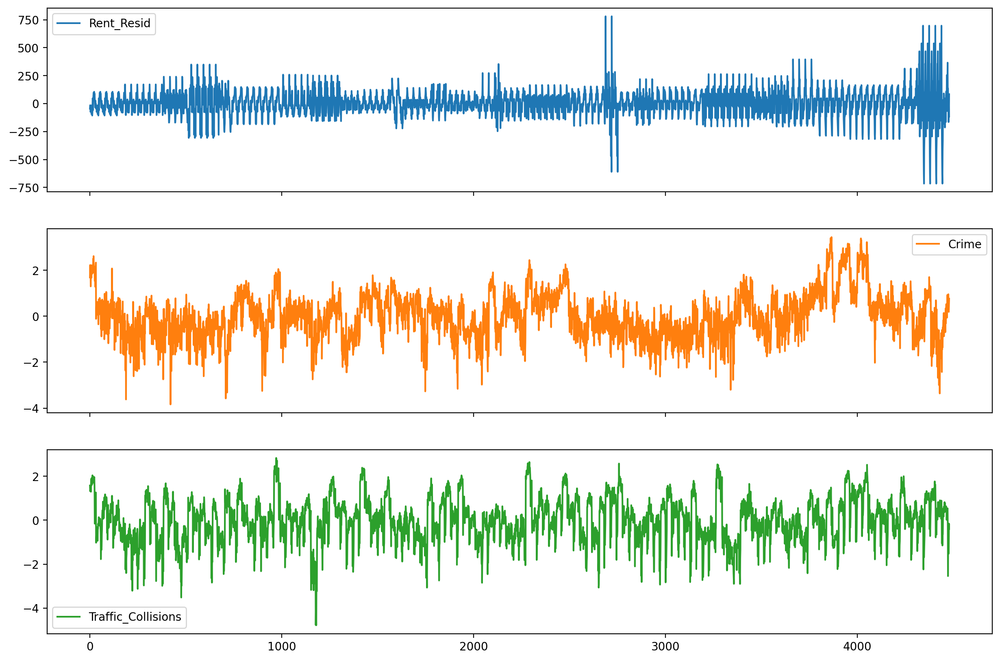

In [62]:
tseries_df.plot(subplots = True, use_index = False)

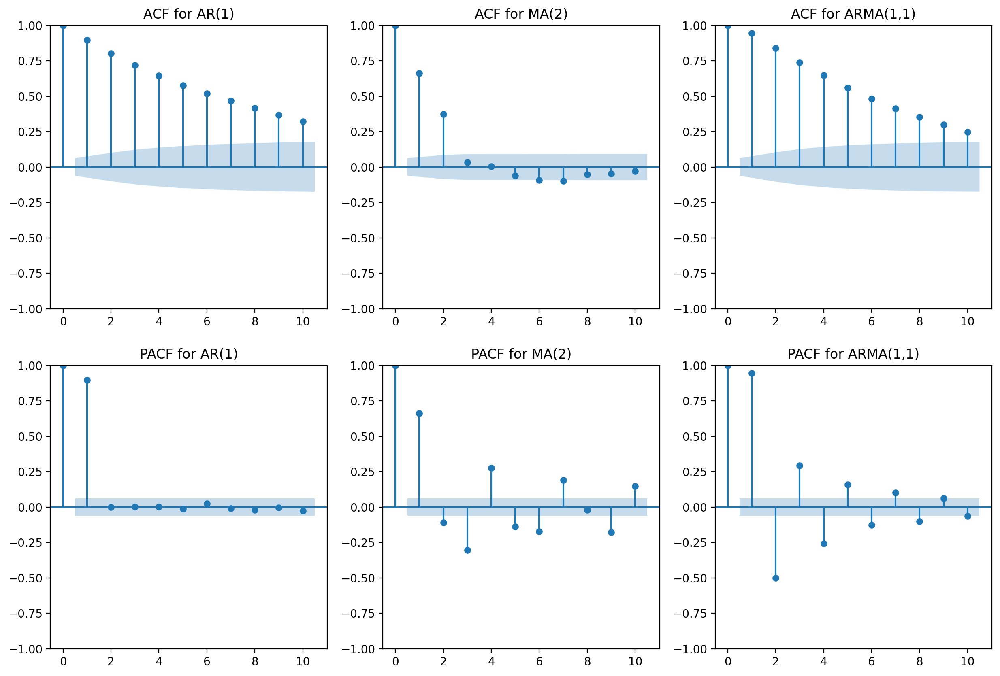

In [63]:
# sample ACF and PACF plot for AR and MA models
ar = np.array([1, -0.9])
ma = np.array([1])
AR_object = ArmaProcess(ar, ma)
simulated_AR = AR_object.generate_sample(nsample = 1000)
ar = np.array([1])
ma = np.array([1, 0.9, 0.9])
MA_object = ArmaProcess(ar, ma)
simulated_MA = MA_object.generate_sample(nsample = 1000)
ar = np.array([1, -0.9])
ma = np.array([1, 0.9])
ARMA_object = ArmaProcess(ar, ma)
simulated_ARMA = ARMA_object.generate_sample(nsample = 1000)
fig, axes = plt.subplots(2, 3)
lag = 10
_ = tsaplots.plot_acf(simulated_AR, lags = lag, ax = axes[0,0], title='ACF for AR(1)')
_ = tsaplots.plot_pacf(simulated_AR, lags = lag, ax = axes[1,0], method = 'ywm', title='PACF for AR(1)')
_ = tsaplots.plot_acf(simulated_MA, lags = lag, ax = axes[0,1], title='ACF for MA(2)')
_ = tsaplots.plot_pacf(simulated_MA, lags = lag, ax = axes[1,1], method = 'ywm', title='PACF for MA(2)')
_ = tsaplots.plot_acf(simulated_ARMA, lags = lag, ax = axes[0,2], title='ACF for ARMA(1,1)')
_ = tsaplots.plot_pacf(simulated_ARMA, lags = lag, ax = axes[1,2], method = 'ywm', title='PACF for ARMA(1,1)')

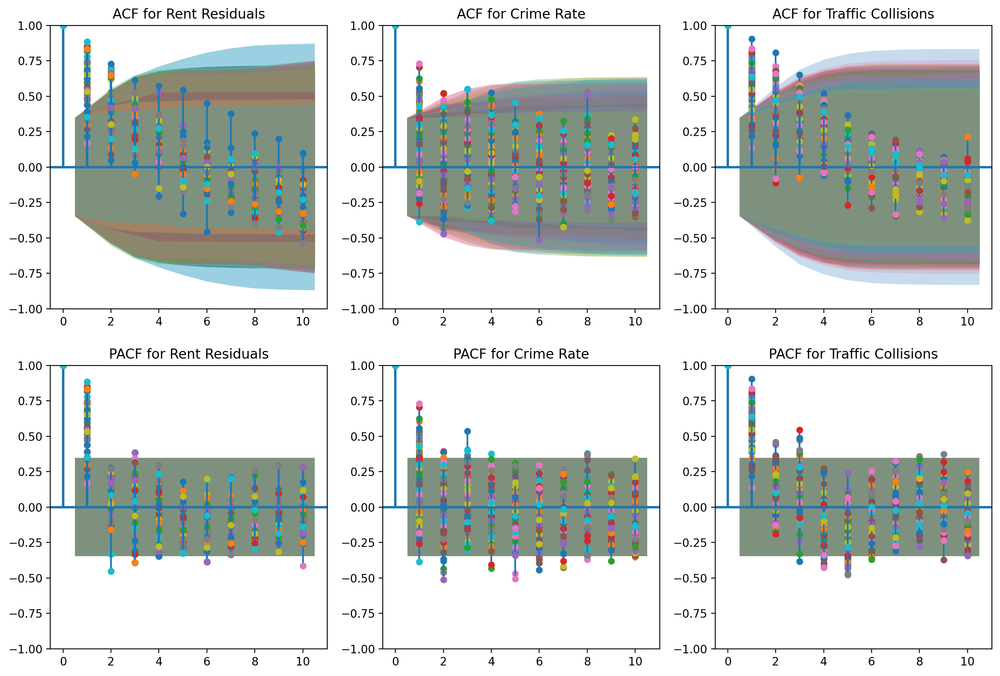

In [64]:
fig, axes = plt.subplots(2, 3)
lag = 10
for hood in tseries_df.hood_id.unique():    
    _ = tsaplots.plot_acf(tseries_df.Rent_Resid[tseries_df.hood_id == hood], lags = lag, ax = axes[0,0], title = 'ACF for Rent Residuals')
    _ = tsaplots.plot_pacf(tseries_df.Rent_Resid[tseries_df.hood_id == hood], lags = lag, ax = axes[1,0], method = 'ywm', title = 'PACF for Rent Residuals')
    _ = tsaplots.plot_acf(tseries_df.Crime[tseries_df.hood_id == hood], lags = lag, ax = axes[0,1], title = 'ACF for Crime Rate')
    _ = tsaplots.plot_pacf(tseries_df.Crime[tseries_df.hood_id == hood], lags = lag, ax = axes[1,1], method = 'ywm', title = 'PACF for Crime Rate')
    _ = tsaplots.plot_acf(tseries_df.Traffic_Collisions[tseries_df.hood_id == hood], lags = lag, ax = axes[0,2], title = 'ACF for Traffic Collisions')
    _ = tsaplots.plot_pacf(tseries_df.Traffic_Collisions[tseries_df.hood_id == hood], lags = lag, ax = axes[1,2], method = 'ywm', title = 'PACF for Traffic Collisions')

## Panel auto ARMA 

In [65]:
def panel_autoARMA(column, max_p = 3, max_q = 3):
    ar_choice = []
    ma_choice = []
    bic_choice = []
    warnings.simplefilter('ignore')
    
    with tqdm(total = (max_p * max_q)) as pbar:
        for ar in range(max_p + 1):
            for ma in range(max_q + 1):
                ar_choice.append(ar)
                ma_choice.append(ma)
                bic_list = []
                for hood in tseries_df.hood_id.unique():    
                    try:
                        model = ARIMA(tseries_df[column][tseries_df.hood_id == hood], order = (ar, 0, ma)).fit()
                        bic_list.append(model.bic)
                    except:
                        bic_list.append(np.nan)
                bic_choice.append(bic_list)
                pbar.update(1)
    return pd.DataFrame({'AR': ar_choice, 
                         'MA': ma_choice, 
                         'BIC_5th': [np.nanquantile(x,0.05) for x in bic_choice],
                         'BIC_25th': [np.nanquantile(x,0.25) for x in bic_choice],
                         'BIC_avg': [np.nanmean(x) for x in bic_choice],
                         'BIC_75th': [np.nanquantile(x,0.75) for x in bic_choice],
                         'BIC_95th': [np.nanquantile(x,0.95) for x in bic_choice]})

In [66]:
resid_arma = panel_autoARMA('Rent_Resid')
crime_arma = panel_autoARMA('Crime')
traffic_arma = panel_autoARMA('Traffic_Collisions')

16it [04:36, 17.29s/it]                      
16it [04:47, 17.99s/it]                      
16it [05:01, 18.86s/it]                      


In [67]:
def plot_BIC(BIC_df, ax = None, title = ""):
    columns = ['BIC_5th', 'BIC_25th', 'BIC_avg', 'BIC_75th', 'BIC_95th']
    if ax is None:
        ax = BIC_df[columns].plot()
    else:
        BIC_df[columns].plot(ax = ax)
    suggestion_90pct = BIC_df[['BIC_5th', 'BIC_95th']].sum(axis=1).idxmin()
    ax.set_title(title + f" / Suggested ARMA: ({BIC_df['AR'][suggestion_90pct]}, {BIC_df['MA'][suggestion_90pct]})")
    ax.set_ylabel('BIC')
    ax.set_xlabel('ARMA (p,q)')
    ax.set_xticks(BIC_df.index)
    ax.set_xticklabels([','.join([str(x),str(y)]) for x, y in zip(BIC_df.AR, BIC_df.MA)])
    return ax

<AxesSubplot:title={'center':'Traffic Collisions / Suggested ARMA: (1, 0)'}, xlabel='ARMA (p,q)', ylabel='BIC'>

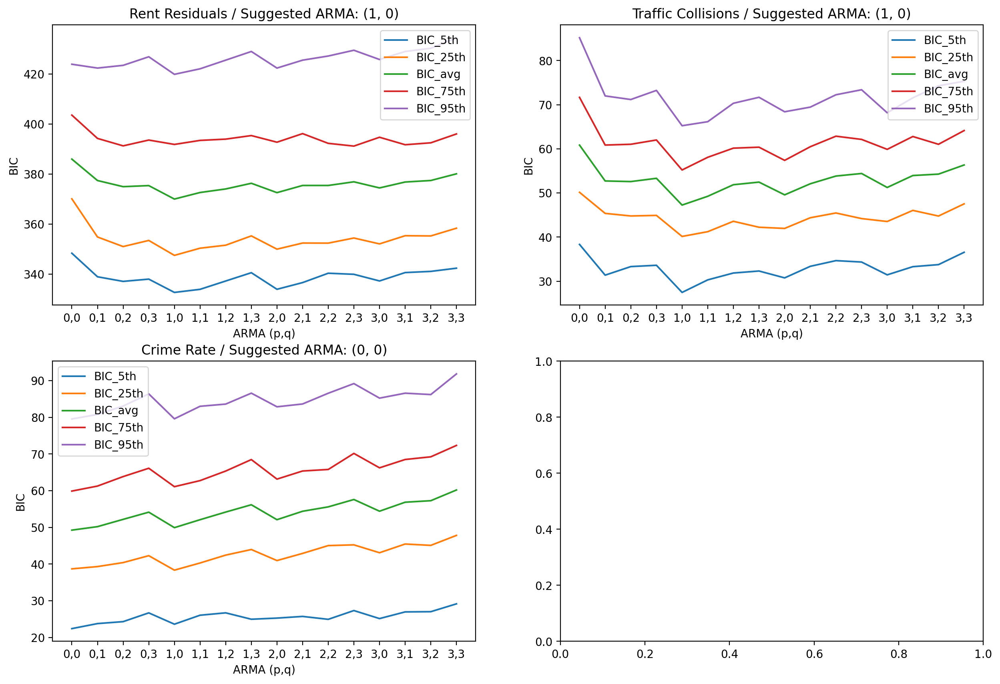

In [68]:
fig, axes = plt.subplots(2, 2)
plot_BIC(resid_arma, axes[0,0], 'Rent Residuals')
plot_BIC(crime_arma, axes[1,0], 'Crime Rate')
plot_BIC(traffic_arma, axes[0,1], 'Traffic Collisions')

## Out-sample forecast

In [129]:
def arma_predict(hood, ar, ma, column, steps = 1):
    return ARIMA(tseries_df[column][tseries_df.hood_id == hood], order = (ar, 0, ma)).fit().forecast(steps).values.tolist()

In [176]:
sorted_hood = sorted(tseries_df.hood_id.unique())
forward_steps = 4
print("prediction for", [(tseries_df.index.max() + i + 1).strftime('%YQ%q') for i in range(forward_steps)])

prediction for ['2022Q1', '2022Q2', '2022Q3', '2022Q4']


In [175]:
# n-step forecast based on suggested ARMA
pred_df = pd.DataFrame(
    {
        'hood_id': np.repeat(sorted_hood, forward_steps).tolist(),
        'Time': [(tseries_df.index.max() + i + 1).year + (tseries_df.index.max() + i + 1).month/12 for i in range(forward_steps)] * len(sorted_hood),
        'Rent_Resid': [x for sublist in [arma_predict(hood_i, ar=1, ma=0, column='Rent_Resid', steps=forward_steps) for hood_i in sorted_hood] for x in sublist],
        'Crime': [x for sublist in [arma_predict(hood_i, ar=0, ma=0, column='Crime', steps=forward_steps) for hood_i in sorted_hood] for x in sublist],
        'Traffic_Collisions': [x for sublist in [arma_predict(hood_i, ar=1, ma=0, column='Traffic_Collisions', steps=forward_steps) for hood_i in sorted_hood] for x in sublist]
    })

In [177]:
pred_df

,hood_id,Time,Rent_Resid,Crime,Traffic_Collisions
0,1,2022.25,-2.402947,1.956886,1.327181
1,1,2022.50,-2.424291,1.956886,1.371819
2,1,2022.75,-2.438169,1.956886,1.402620
3,1,2023.00,-2.447192,1.956886,1.423874
4,10,2022.25,-12.507959,-0.789858,-1.370166
...,...,...,...,...,...
555,98,2023.00,1.533152,0.173412,0.025921
556,99,2022.25,-135.462079,-1.447769,0.638294
557,99,2022.50,-105.789099,-1.447769,0.666866
558,99,2022.75,-83.156023,-1.447769,0.682064


In [209]:
output = pd.DataFrame({
    'hood_id': pred_df.hood_id,
    'Time': pred_df.Time,
    'RoomType': roomtype,
    'AvgLeaseRatePerRoom': best_subset.predict({'hood_id': pred_df.hood_id, 'Time': pred_df.Time}),
    'MCI_rate': np.exp(pred_df['Crime'] * np.log(regression_table['MCI_rate']).std() + np.log(regression_table['MCI_rate']).mean()),
    'collision_rate': np.exp(pred_df['Traffic_Collisions'] * np.log(regression_table['collision_rate']).std() + np.log(regression_table['collision_rate']).mean())
})

output

,hood_id,Time,RoomType,AvgLeaseRatePerRoom,MCI_rate,collision_rate
0,1,2022.25,SharedApartments,1080.745780,578.831539,875.556484
1,1,2022.50,SharedApartments,1092.437228,578.831539,899.005564
2,1,2022.75,SharedApartments,1104.128676,578.831539,915.551461
3,1,2023.00,SharedApartments,1115.820124,578.831539,927.145956
4,10,2022.25,SharedApartments,1289.385245,155.462629,177.289259
...,...,...,...,...,...,...
555,98,2023.00,SharedApartments,1846.474227,246.517169,405.205344
556,99,2022.25,SharedApartments,1563.032422,113.468550,582.293772
557,99,2022.50,SharedApartments,1574.723870,113.468550,592.228445
558,99,2022.75,SharedApartments,1586.415318,113.468550,597.581675


In [206]:
output.to_csv('../data/processed/neighbourhoods_prediction.csv', index = False)

# Difference among neighbourhoods?
- if there is no difference, we can model the average lease rate as a single time series
- otherwise we need to model each neighbourhood separately

In [207]:
# Instead of performing an ANOVA to see if we can assume all neighbourhoods share the same average lease rate,
# We can perform an F test for the regression of Rent against dummy variables representing each neighbourhoods
# if at least one of the params is different from 0, we can reject the null hypothesis that all neighbourhoods share the same average rent
# the F statistic here is large enough for us to reject the null
sm.OLS(regression_df[Y], sm.add_constant(pd.get_dummies(regression_table['hood_id']))).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   Rent   R-squared:                       0.747
Model:                            OLS   Adj. R-squared:                  0.739
Method:                 Least Squares   F-statistic:                     92.42
Date:                Mon, 01 Aug 2022   Prob (F-statistic):               0.00
Time:                        16:54:38   Log-Likelihood:                -28921.
No. Observations:                4480   AIC:                         5.812e+04
Df Residuals:                    4340   BIC:                         5.902e+04
Df Model:                         139                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1123.2532      2.320    484.145      0.000    1118.705    1127.802
1           -235.4163     27.549     -8.545      0.000    -289.426    -181.407
10           -26.7768     27.549     -0.972      0.331     -80.786      27.233
100          203.8019     27.549      7.398      0.000     149.792     257.811
101          203.8019     27.549      7.398      0.000     149.792     257.811
102          166.3821     27.549      6.040      0.000     112.373     220.392
103          166.3821     27.549      6.040      0.000     112.373     220.392
104          246.8703     27.549      8.961      0.000     192.861     300.880
105          166.3821     27.549      6.040      0.000     112.373     220.392
106          203.8019     27.549      7.398      0.000     149.792     257.811
107          203.8019     27.549      7.398      0.000     149.792     257.811
108         -171.2311     27.549     -6.216      0.000    -225.240    -117.222
109         -197.5780     27.549     -7.172      0.000    -251.587    -143.569
11           -26.7768     27.549     -0.972      0.331     -80.786      27.233
110         -197.5780     27.549     -7.172      0.000    -251.587    -143.569
111         -197.5780     27.549     -7.172      0.000    -251.587    -143.569
112         -171.2311     27.549     -6.216      0.000    -225.240    -117.222
113         -171.2311     27.549     -6.216      0.000    -225.240    -117.222
114          145.9140     27.549      5.297      0.000      91.905     199.923
115         -171.2311     27.549     -6.216      0.000    -225.240    -117.222
116         -189.3115     27.549     -6.872      0.000    -243.321    -135.302
117         -189.3115     27.549     -6.872      0.000    -243.321    -135.302
118         -189.3115     27.549     -6.872      0.000    -243.321    -135.302
119         -249.3018     27.549     -9.050      0.000    -303.311    -195.292
12           -26.7768     27.549     -0.972      0.331     -80.786      27.233
120         -249.3018     27.549     -9.050      0.000    -303.311    -195.292
121           10.9792     27.549      0.399      0.690     -43.030      64.989
122           10.9792     27.549      0.399      0.690     -43.030      64.989
123         -279.7994     27.549    -10.157      0.000    -333.809    -225.790
124         -249.3018     27.549     -9.050      0.000    -303.311    -195.292
125         -249.3018     27.549     -9.050      0.000    -303.311    -195.292
126         -249.3018     27.549     -9.050      0.000    -303.311    -195.292
127         -119.7944     27.549     -4.348      0.000    -173.804     -65.785
128         -210.0231     27.549     -7.624      0.000    -264.033    -156.014
129         -210.0231     27.549     -7.624      0.000    -264.033    -156.014
13           -26.7768     27.549     -0.972      0.331     -80.786      27.233
13

# Improvement
- cross validation to validate model https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_forecasting.html#Specifying-the-number-of-forecasts 
- train-test split to evaluate model performance

# Notes

Assumptions to check
- Multicollinearity
  - Why is it a problem?
    1) Hard to interpret the parameters as the sign can become opposite
    2) Hard to make inferences about the parameters as standard errors can be wrong
    - Check for below signs:
      1) Significant correlations between independent variables
      2) Variance inflation factor (VIF) > 10
- There should be no outliers and influential observations
  - Outliers may represent erroneous data which should be corrected
  - Influential observations are observations far from its mean (i.e. observations with high leverage)
      - They can have a strong impact on the value of parameters estimated, rendering any t test or F test useless in measuing model's performance
  - Cook's distance measures both leverage and residual of each observation
      -  Cook's distance > 1 indicates an influential observation that can severly impact the regression results

Residual diagnostics
- To conduct hypothesis testing of regression coefficients and form prediction intervals of future values of y, we must satisfy the following assumptions:
- (1) ε is normally distributed,
- (2) with a mean of 0, 
- (3) the variance σ^2 is constant, and 
- (4) all pairs of error terms are uncorrelated

<img src='../data/image/2022-05-08-00-44-27.png'>
<img src='../data/image/2022-05-08-00-45-04.png'>

In [ ]:
# np.random.seed(123)
# calculating many bootstrap replicates
# def draw_bs_reps(df, size=10**4):
#     """Draw bootstrap replicates of linear regression."""

#     # Initialize array of replicates: bs_replicates
#     # bs_replicates = None
#     bs_replicates_intercept = np.empty(size)
#     bs_replicates_slope1 = np.empty(size)
#     bs_replicates_slope2 = np.empty(size)
#     # Generate replicates
#     for i in range(size):
#         inds = np.arange(df.shape[0])
#         # generate a list of indices with replcaement with the same size as our original dataframe
#         # to ensure the distribution of bootstrap replicates is the same as that of our estimated coefficients
#         bs_inds = np.random.choice(inds, size = len(inds), replace = True)
#         # pairwise bootstrapping on Y and Xs
#         bootstrap_df = df.iloc[bs_inds]
#         X_df = bootstrap_df[[*best_subsets]]
#         X_df.insert(0, 'Intercept', 1)
#         # use (Moore-Penrose) pseudo-inverse to speed up regression since we only need the estimated coefficients
#         bs_replicates_intercept[i], bs_replicates_slope1[i], bs_replicates_slope2[i] = np.linalg.pinv(X_df) @ bootstrap_df[Y]

#     return bs_replicates_intercept, bs_replicates_slope1, bs_replicates_slope2

#### Confidence Intervals
Let's compare the confidence interval of regression coefficients with the following obtained from bootstrapped samples:
  - Normal interval
  - Percentile interval
  - Bias corrected interval

While t tests from regression are significant for all estimated coefficients,
  - Bootstrapping helps verify that 
    - We can be 95% confident that our confidence intervals would contain the true coefficients after adjusting familywise error rate (FWER) with Bonferroni correction to address statistical multiplicity
    - Violation of residual assumptions are not extreme enough to significantly impact our confidence intervals and statistical tests of estimated parameters
  - Since 0 is not within our confidence intervals, all of our estimated coefficients are significant

In [ ]:
# normal, percentile, BC + Lower Bound / Upper Bound
# bonferroni_correction = 2 # number of t tests to be conducted simultaneously
# alpha = 0.05 / bonferroni_correction # 95% confidence interval corrected by Bonferroni correction to address statistical multiplicity
# tails = 2 # two-tailed test
# intervals = None

# for i, (sample_statistic, bs_statistic) in enumerate(zip([slope1, slope2], 
#                                                          [bs_slope1, bs_slope2])):
    
#     # OLS intervals
#     # ols_interval = best_subsets_results.conf_int().iloc[i+1].tolist()
    
#     # normal intervals
#     normal = stats.norm.ppf(alpha/tails)
#     normal_interval = [sample_statistic + normal * np.std(bs_statistic), sample_statistic - normal * np.std(bs_statistic)]
    
#     # percentile intervals
#     percentile = [alpha/tails*100, (1-alpha/tails)*100]
#     percentile_interval = np.percentile(bs_statistic, percentile)
    
#     # Bias corrected intervals (BC)
#     bias_correction = stats.norm.ppf(sum(bs_statistic <= sample_statistic) / len(bs_statistic)) # remove statistical bias due to randomness
#     bc_percentile = [stats.norm.cdf(bias_correction + normal)*100, stats.norm.cdf(bias_correction - normal)*100]
#     bc_interval = np.percentile(bs_statistic, bc_percentile)
    
#     intervals = pd.concat([intervals, pd.DataFrame([normal_interval, percentile_interval, bc_interval])])

# intervals

# intervals_index = pd.MultiIndex.from_arrays([np.repeat([*best_subsets_results.params.index.values[1:]],3).tolist(),
#                                              ['Normal', 'Percentile', 'Bias Corrected']*int(intervals.shape[0]/3)],
#                                             names = ['Coefficients', 'Confidence Intervals'])
# intervals_columns = [f'{(1-alpha*bonferroni_correction)*100:0.0f}% CI Lower Bound', f'{(1-alpha*bonferroni_correction)*100:0.0f}% CI Upper Bound']
# intervals.index = intervals_index
# intervals.columns = intervals_columns
# intervals

95% CI Lower Bound  95% CI Upper Bound
Coefficients Confidence Intervals                                        
Lease_Demand Normal                         12.058286           31.900529
             Percentile                     12.155857           31.979526
             Bias Corrected                 12.158712           31.983661
Distance     Normal                       -196.645175         -178.456662
             Percentile                   -196.612066         -178.503892
             Bias Corrected               -196.606744         -178.501091

## more notes
sampling methods
- simple random sampling
- stratified random sampling
- cluster sampling
- systematic sampling
- convenience sampling
- judgement sampling

Hypothesis testing
- null and alternative
- reject null -> type I error (alpha)
- accept null -> type II error (beta)
- random sample / matched sample
- test of independence

ANOVA
- comparing means
- bonferroni correction and other techniques for correcting error rates
- randomized block design
- 2-factor design

Linear regression
- 5 assumptions of linear regression
- significance: t test and F test
    - caution: no casual relationship / extrapolation
- residuals plots
- check for outlier and influential observation
    - remove to see impact
    - leverage and cook's distance
- check for multicollinearity